# Plot sequence space using UMAP reduced coordinates of protein sequence vectors

This notebook shows how to create interactive visualizations of the UMAP data.
  
**Required:** Run the [**run pipeline**](./run_pipeline.ipynb) notebook first to make sure the required outputs are present.   

In [1]:
import pandas as pd
import proteinclustertools.visuals.circle_plot as cp

Loading BokehJS ...

Read in the UMAP coordinate data. (Could be any table with an x, y value)

In [2]:
# load umap, coordinates
umap = pd.read_csv('../output/IPR001761_umap.csv')
umap.head()

,x,y,id
0,9.273517,-8.408992,28487
1,8.672923,3.266593,2087
2,9.880362,-4.030814,10388
3,-0.789630,5.731845,29547
4,8.161972,12.242285,2763


Since these are just individual sequences (no cluster aggregation necessary), we can remap the IDs and have them show directly.

In [3]:
# load header map
header_map=pd.read_csv('../output/IPR001761_header_map.txt')
header_map['header']=header_map['header'].apply(lambda x: x.split('|')[1])
header_map.head()

,id,header
0,0,Q88HH7
1,1,A0A0M1P0M0
2,2,A0A100YV14
3,3,A0A1C7IBZ4
4,4,A0A1R4KFK1


We can keep a copy of the IDs as 'cluster' IDs for later annotation. This column is labelled 'sequence' and will be used in later annotation functions.

In [4]:
umap['id']=umap['id'].map(header_map.set_index('id')['header'].to_dict())
cluster_label='sequence'
umap[cluster_label]=umap['id']
umap.head()

,x,y,id,sequence
0,9.273517,-8.408992,A0A6N3YWU5,A0A6N3YWU5
1,8.672923,3.266593,A0A942WDI7,A0A942WDI7
2,9.880362,-4.030814,A0A924F5W7,A0A924F5W7
3,-0.789630,5.731845,A0A1G9IQZ2,A0A1G9IQZ2
4,8.161972,12.242285,A0A076JJ98,A0A076JJ98


Make a layout from the coordinates.

In [5]:
coords=cp.CoordinatesToCircles(umap['x'], umap['y'], umap['id'])
layout={cluster_label:dict((c.id, c) for c in coords)}

Do a plot of just the points without any extra annotations.

In [6]:
plot, plot_data=cp.CirclePlot(layout, 
              fixed_point_size=5)

Create some annotations

In [7]:
annot_table=pd.read_csv('../data/IPR001761_with_taxonomy.tsv', sep='\t')
annot_table.head()

,Entry,Reviewed,Length,Organism (ID),PDB,Superkingdom,Phylum
0,G3XD97,reviewed,340,208964,NaN,Bacteria,Pseudomonadota
1,P02924,reviewed,329,83333,1ABE;1ABF;1APB;1BAP;2WRZ;5ABP;6ABP;7ABP;8ABP;9...,Bacteria,Pseudomonadota
2,P0ACP1,reviewed,334,83333,1UXC;1UXD;2IKS;,Bacteria,Pseudomonadota
3,Q88HH7,reviewed,339,160488,NaN,Bacteria,Pseudomonadota
4,Q9KM69,reviewed,326,243277,NaN,Bacteria,Pseudomonadota


We can give different input to the tools that were meant to process clusters, by assigning each sequence is its own cluster.

In [8]:
import proteinclustertools.visuals.annotate as an
from matplotlib.colors import ListedColormap

phylums=an.AnnotateClusters(umap, [cluster_label], annot_table, 'Phylum', 'id', 'Entry')
phylum_colors=an.ColorAnnot(phylums, cmap='Set3', top_n=10, saturation=.7, shuffle_colors_seed=1, direct_map_colors=True) # use direct_map_colors to bypass slower blending code
reviewed=an.AnnotateClusters(umap[umap['id'].isin(annot_table[annot_table['Reviewed']=='reviewed']['Entry'])], [cluster_label], annot_table, 'Reviewed', 'id', 'Entry')
reviewed_colors=an.ColorAnnot(reviewed, cmap=ListedColormap(['Red']), saturation=.7)
lengths=an.AnnotateClusters(umap, [cluster_label], annot_table, 'Length', 'id', 'Entry')
length_colors=an.ColorAnnot(lengths, cmap='Reds', saturation=.7, vmin=200, vmax=500)

Plot with the annotations.

In [9]:
plot, plot_data1=cp.CirclePlot(layout,
                fixed_point_size=3,
                annot_text=[phylums, reviewed, lengths], singleton_annot_text=True, # make sure to use singleton_annot_text=True to make labelling faster
                annot_colors=phylum_colors, 
                outlines=reviewed_colors, base_line_width=0, highlight_line_width=5)

Plot with numerical range.

In [10]:
plot, plot_data2=cp.CirclePlot(layout,
                            fixed_point_size=3,
                            annot_text=[phylums, lengths], singleton_annot_text=True, # make sure to use singleton_annot_text=True to make labelling faster
                            annot_colors=length_colors, 
                            base_line_width=0)

Save the plot.

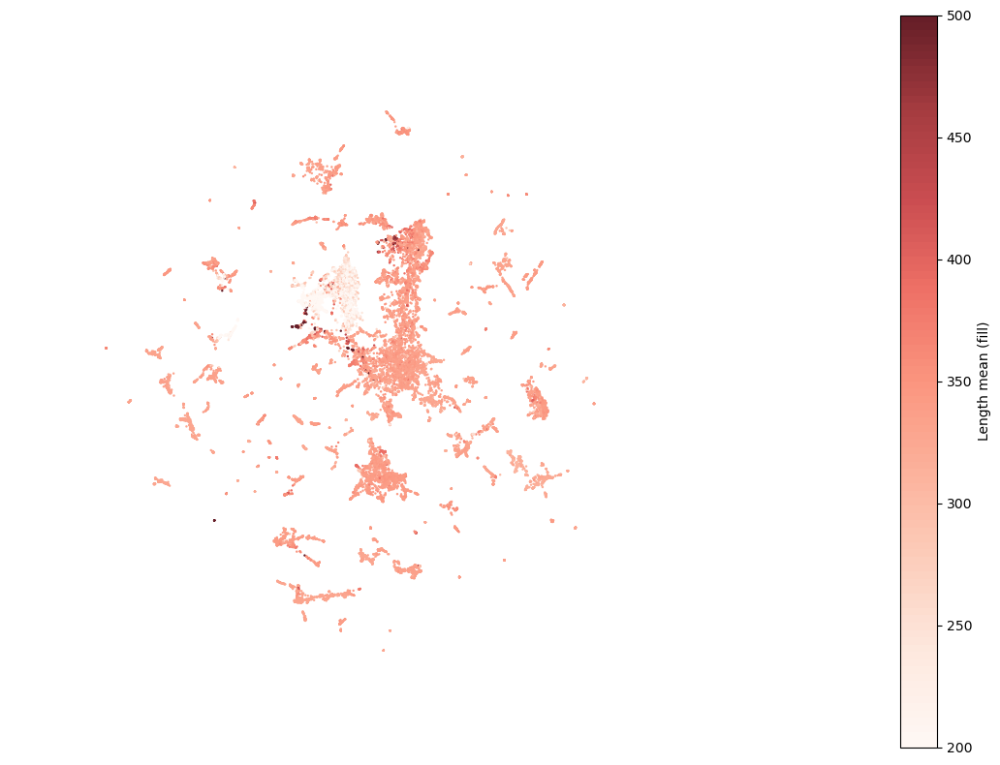

In [11]:
f = cp.ExportFigure(layout, plot_data2, size=8, as_scatter=True, fixed_point_size=3)

f.savefig('figures/umap_lengths.pdf', bbox_inches='tight')